In [2]:
import os
current_directory = os.getcwd()
print(f"Current Working Directory: {current_directory}")

from Tusc5ImageUtils import *
import numpy as np
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
from skimage import exposure
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io, plot, models, denoise
from scipy.ndimage import binary_erosion, binary_fill_holes, center_of_mass
from scipy.signal import find_peaks
import subprocess
import pandas as pd
import seaborn as sns
import re
import nd2
from skimage.measure import regionprops
from datetime import datetime

Current Working Directory: d:\Lab Analysis PC\ImageAnalysis


c:\Users\Luis\anaconda3\envs\cellpose\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [234]:
### Directory Configuration ###
parent_directory = os.path.dirname(current_directory) # Parent directory
target_folder = os.path.join(parent_directory, 'All stacks')
nd2_files = [f for f in os.listdir(target_folder) if f.endswith('.nd2')]

Processing 2006L_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2006L_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2006L_GLUT1_647_WGA_594_0003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2006R_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2006R_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2007L_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2007L_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2007R_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 2007R_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3101R_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3101R_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3201L_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3203L_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3203L_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3203R_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3203R_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3318L_GLUT1_647_WGA_594_0003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3318L_GLUT1_647_WGA_594_0004.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3318R_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3420L_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3420L_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)
C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 2, figsize=(7, 7))


Processing 3420L_GLUT1_647_WGA_594_0003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3420RA_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3420RA_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3420RA_GLUT1_647_WGA_594_0003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LC_dark_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LC_dark_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LC_dark_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LD_dark_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LD_dark_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LD_dark_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527LD_dark_WGA594_GLUT1_647_TUSC5_004.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527RA_light_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527RA_light_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3527RA_light_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3529RC_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3529RD_GLUT1_647_WGA_594_0001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3529RD_GLUT1_647_WGA_594_0002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3529RD_GLUT1_647_WGA_594_0003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LC_dark_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LC_dark_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LC_dark_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LD_dark_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LD_dark_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574LD_dark_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RA_light_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RA_light_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RA_light_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RB_light_WGA594_GLUT1_647_TUSC5_001.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RB_light_WGA594_GLUT1_647_TUSC5_002.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


Processing 3574RB_light_WGA594_GLUT1_647_TUSC5_003.nd2


C:\Users\Luis\AppData\Local\Temp\ipykernel_10472\2145454438.py:12: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


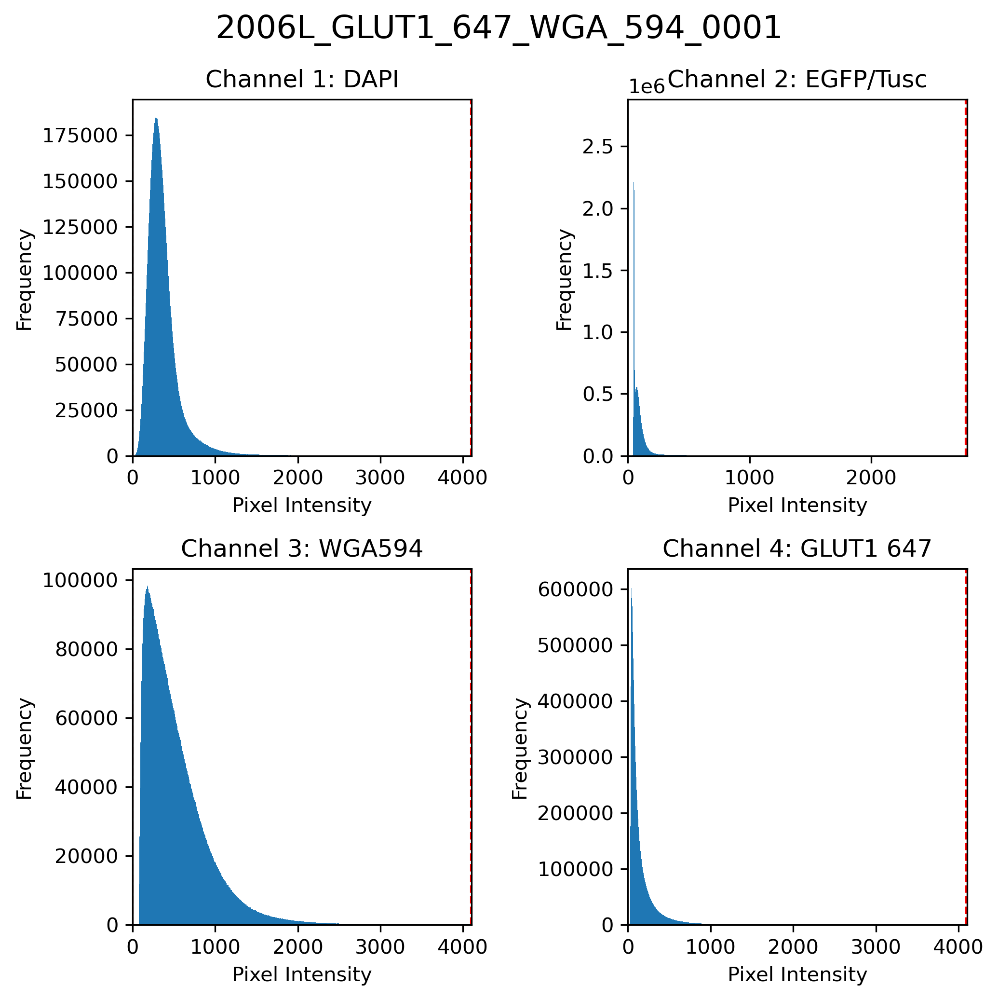

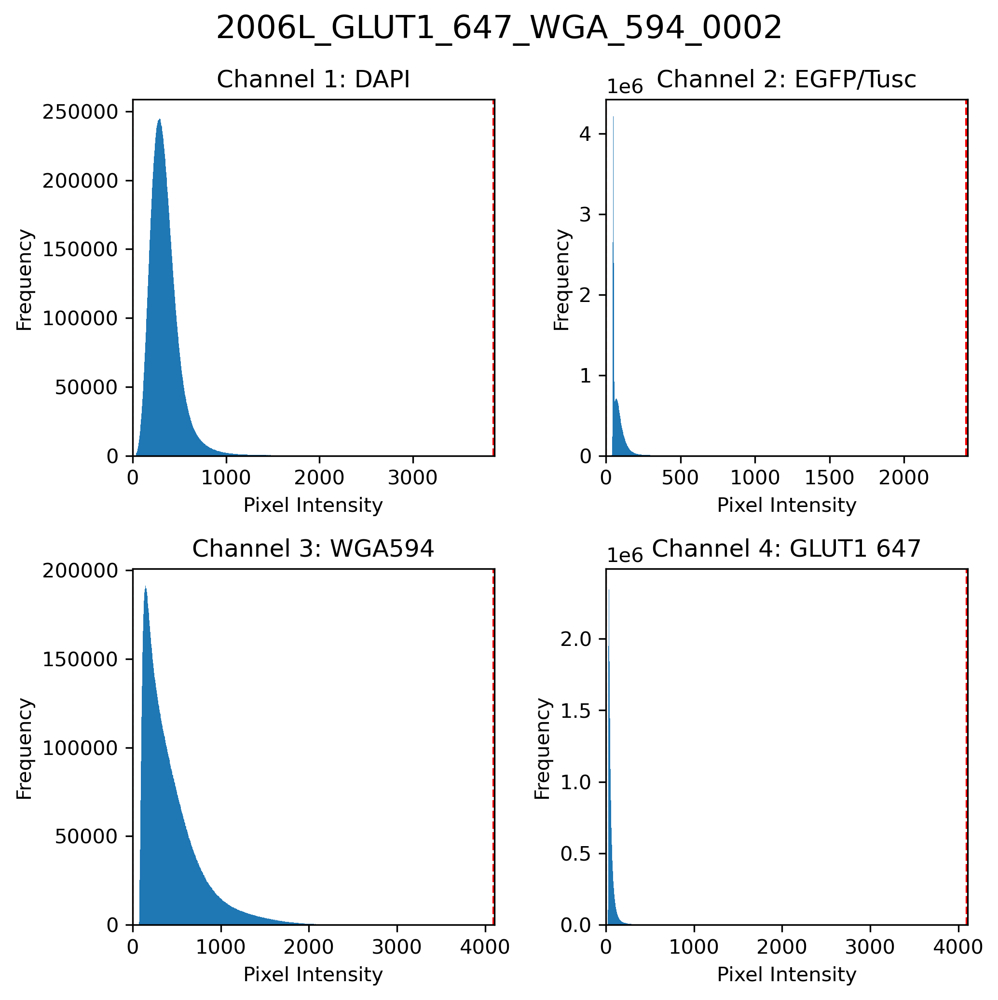

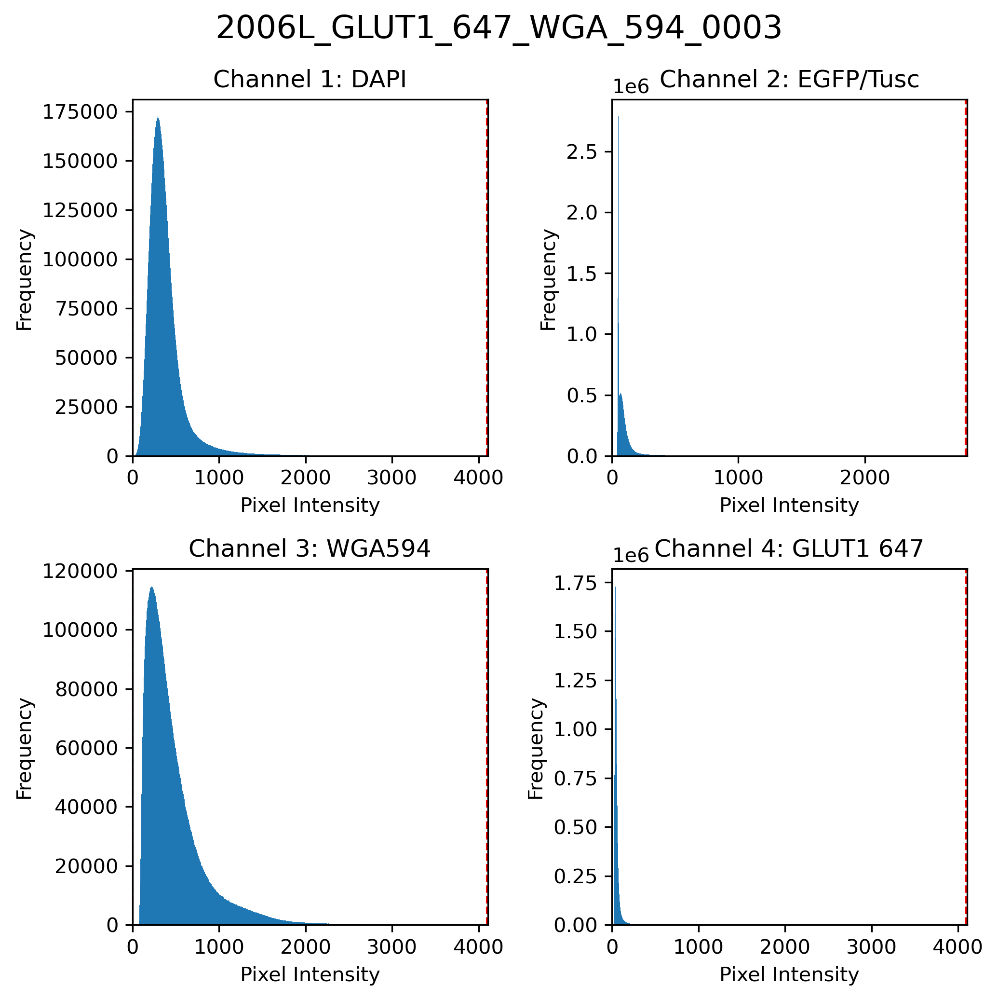

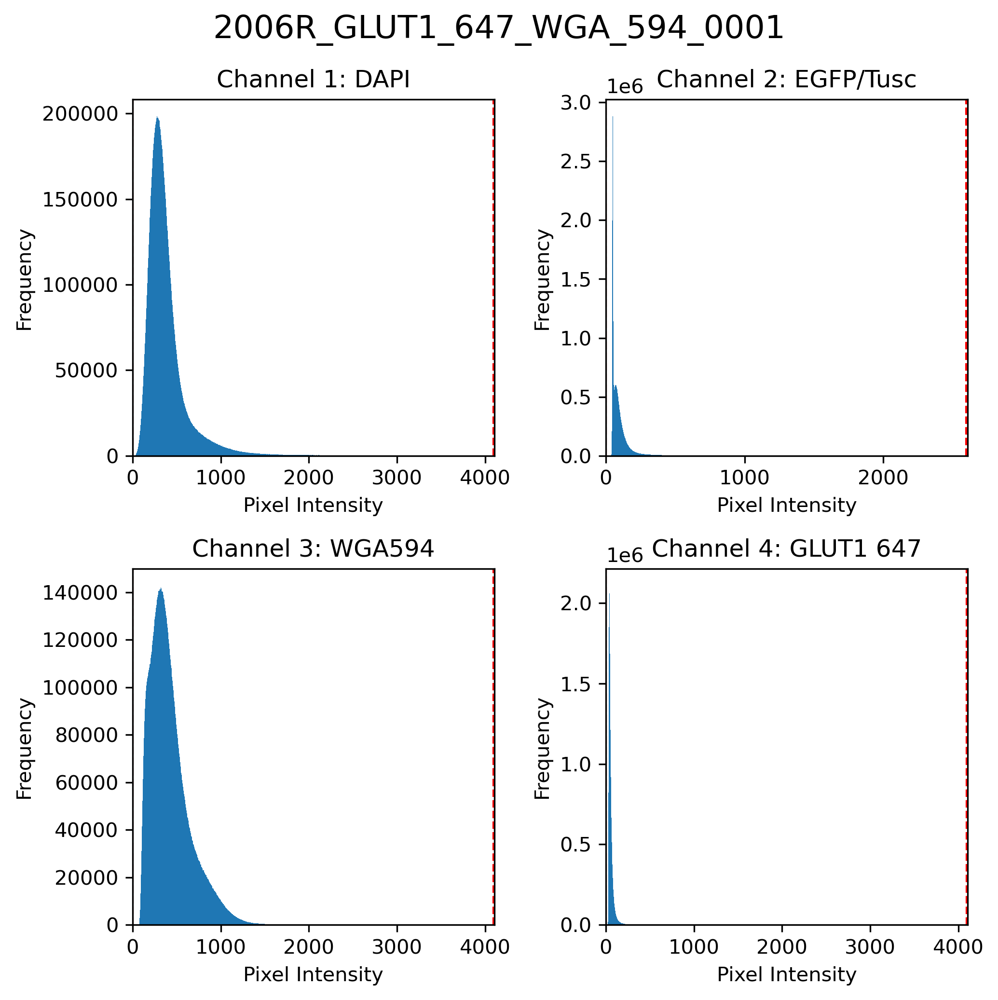

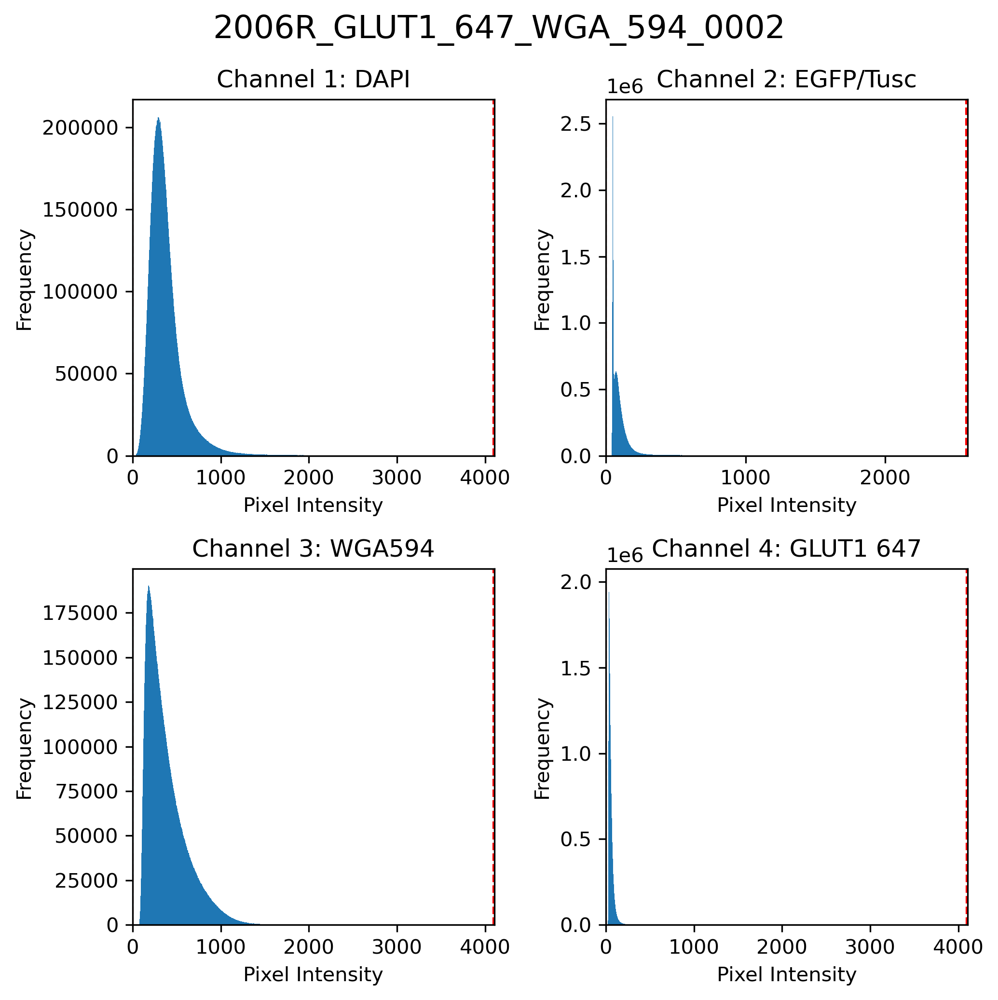

...

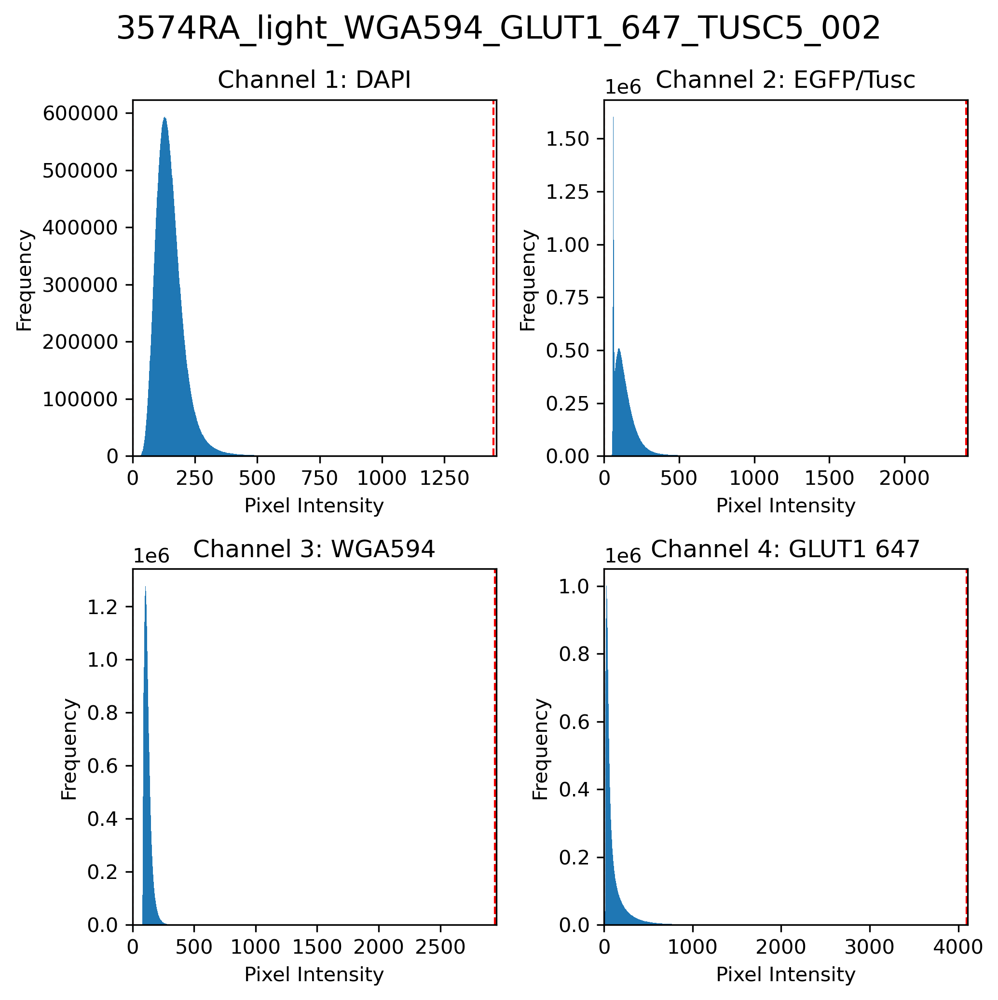

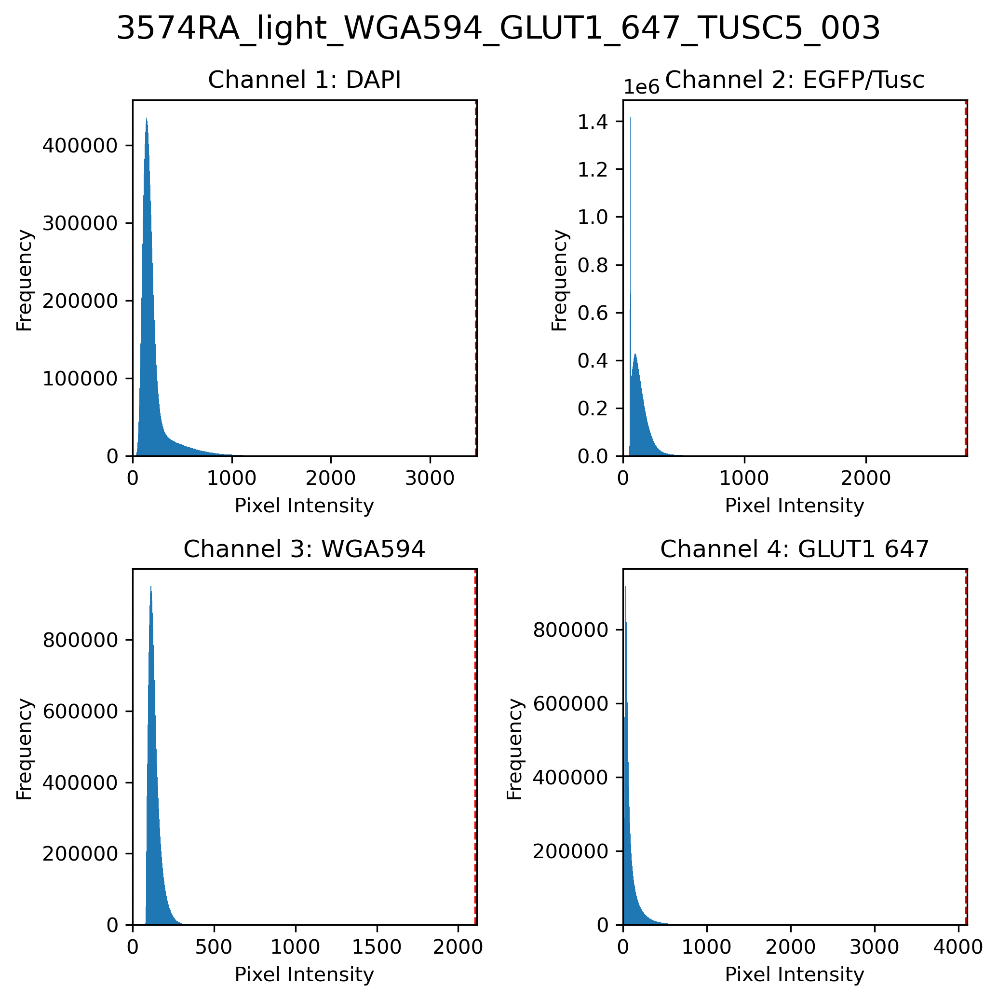

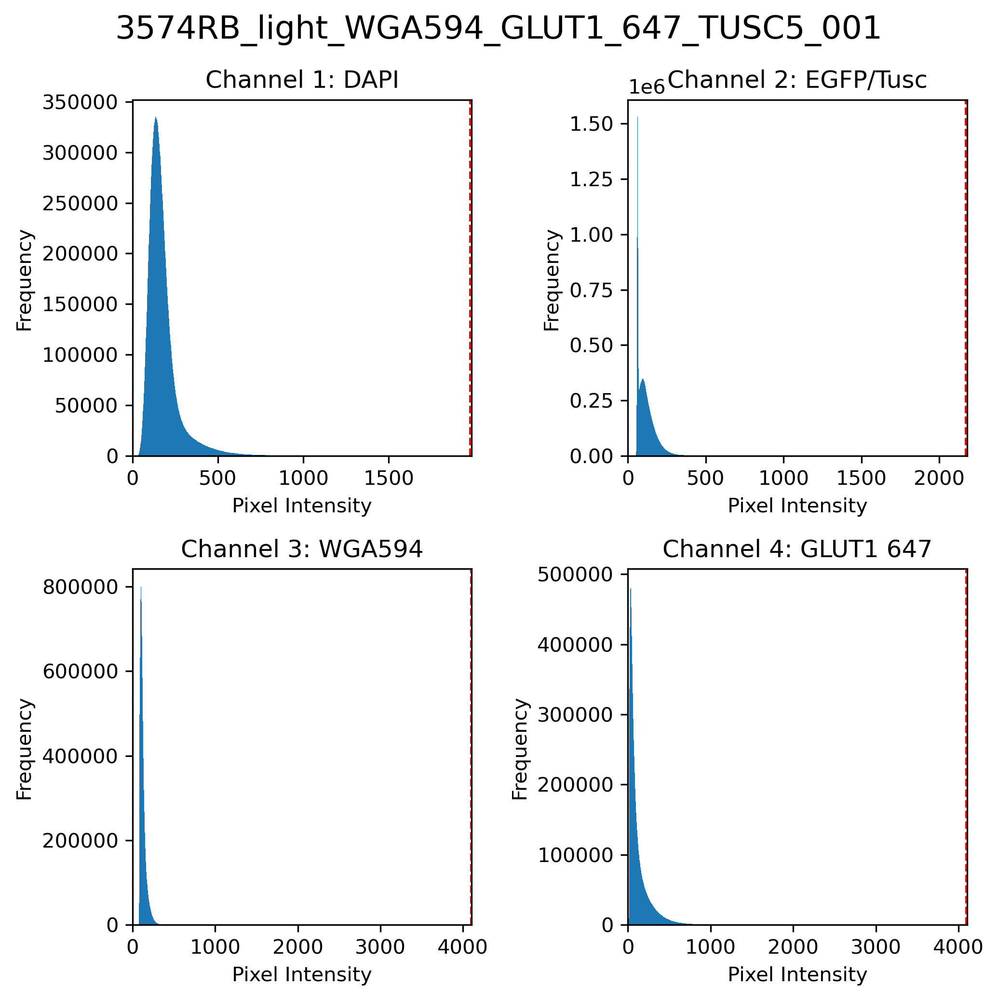

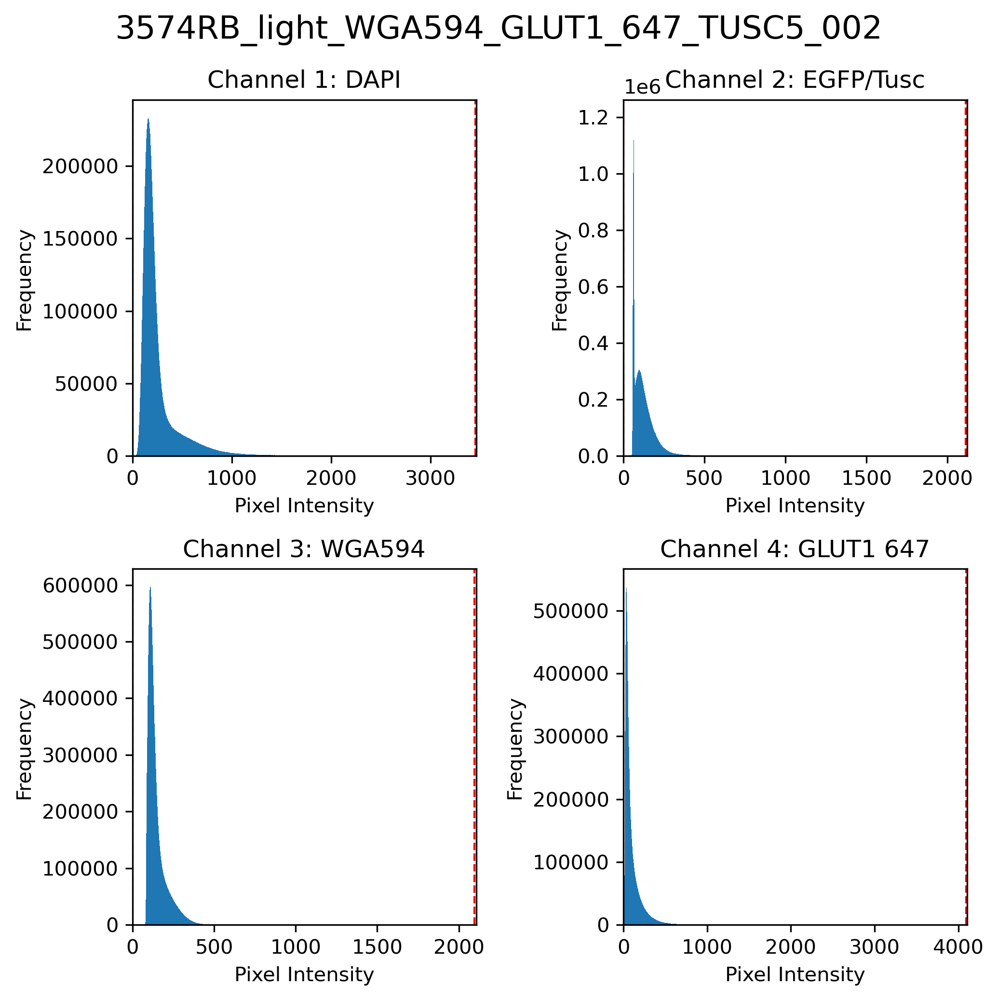

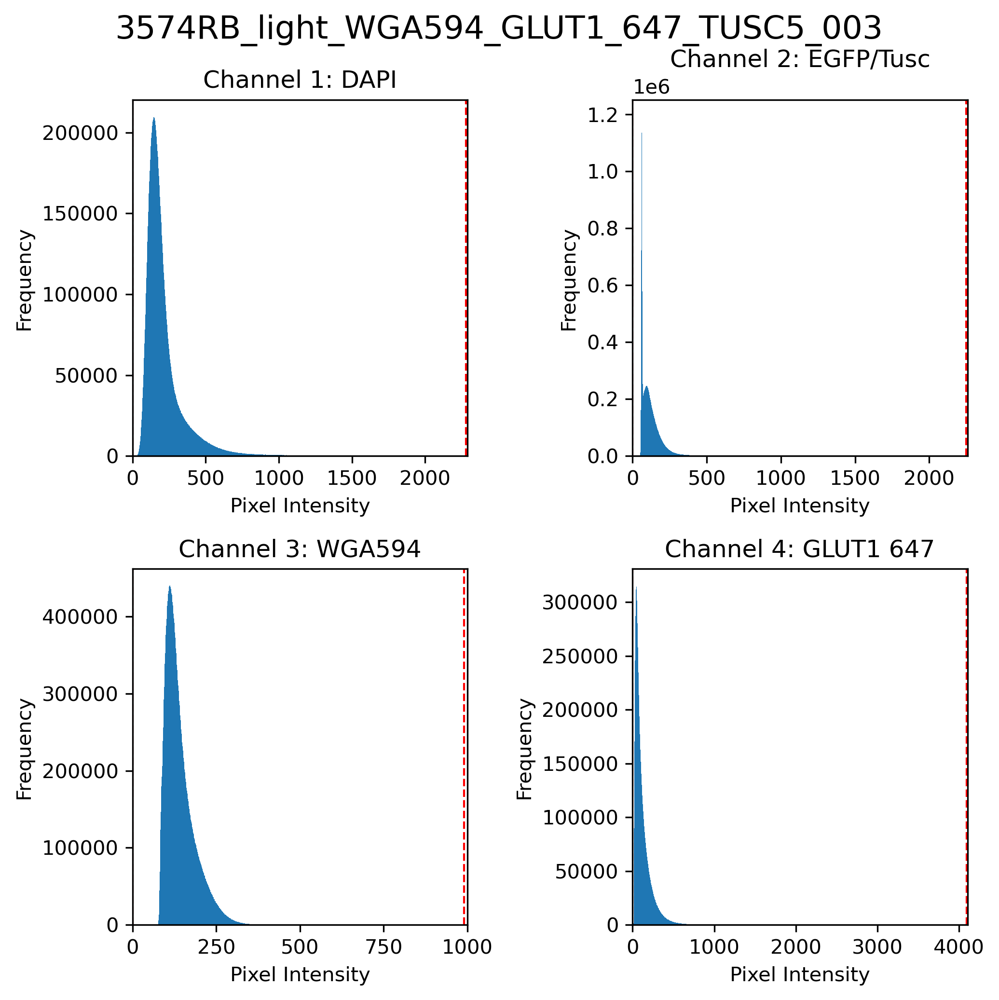

In [235]:
image_folder = os.path.join(parent_directory, 'All stacks images')

all_dfs_hold = []

for nd2_file in nd2_files:

    image_name = nd2_file.split('.nd2')[0]

    # 1) Download Image Data
    print(f'Processing {nd2_file}')
    nd2_path = os.path.join(target_folder, nd2_file)
    f = nd2.ND2File(nd2_path)

    ### Getting microscope details

    microscope_config = pd.DataFrame({
        'objective_magnification': [f.metadata.channels[0].microscope.objectiveMagnification],
        'numerical_aperture': [f.metadata.channels[0].microscope.objectiveNumericalAperture],
        'pinhole_diam_um' : [f.metadata.channels[0].microscope.pinholeDiameterUm]
    })

    channel_list = []

    ### Getting stain names and associate laser wavelength

    for channel in range(len(f.metadata.channels)):
        stain_name = f.metadata.channels[channel].channel.name
        excitation_wavelength = f.metadata.channels[channel].channel.excitationLambdaNm

        temp_df = pd.DataFrame({
            'Stain_Name': [stain_name],
            'excitation_wavelength': [excitation_wavelength]
        })

        channel_list.append(temp_df)

    names_excitations_df = pd.concat(channel_list).reset_index(drop = True)

    ### Getting the laser power and gain for each stain

    # Code to structure string information. This meta data is only accessible through a long string
    text_str = f.text_info['capturing']
    laser_gain_config = {}
    pattern = r'(CH\d)\t\{Laser Wavelength\}: (\d+\.\d+)\t\{Laser Power\}: (\d+\.\d+)\r\n\t\{PMT HV\}: (\d+)\t\{PMT Offset\}: (\d+)'
    matches = re.findall(pattern, text_str)
    for match in matches:
        channel, wavelength, power, pmt_hv, pmt_offset = match
        laser_gain_config[channel] = {
            'Laser Wavelength': float(wavelength),
            'Laser Power': float(power),
            'PMT HV': int(pmt_hv),
            'PMT Offset': int(pmt_offset)
        }

    df_storage = []

    for key in laser_gain_config.keys():
        temp_df = pd.DataFrame({
            'Laser_Wavelength': [laser_gain_config[key]['Laser Wavelength']],
            'Laser_Power': [laser_gain_config[key]['Laser Power']],
            'PMT_HV': [laser_gain_config[key]['PMT HV']],
            'PMT_Offset': [laser_gain_config[key]['PMT Offset']],
        }
        )

        df_storage.append(temp_df)

    laser_gain_df = pd.concat(df_storage).reset_index(drop = True)

    ### Merging stain names to respective power and gain

    names_excitations = names_excitations_df.rename(columns = {'excitation_wavelength': 'Laser_Wavelength'})

    stains_power_gain = pd.merge(names_excitations, laser_gain_df)

    stains_power_gain['file_name'] = image_name

    all_dfs_hold.append(stains_power_gain)

    ### Plotting and saving graph

    image = f.asarray()

    stain_names = names_excitations['Stain_Name'].unique()
    num_channels = image.shape[1]

    fig, axes = plt.subplots(2, 2, figsize=(7, 7))
    axes = axes.flatten()

    plt.suptitle(image_name, fontsize=16)

    for ch in range(num_channels):
        # Flatten the (z_slices, x, y) array into 1D
        pixel_values = image[:, ch, :, :].flatten()
        
        # Calculate the minimum and maximum pixel intensities for the channel
        min_intensity = pixel_values.min()
        max_intensity = pixel_values.max()
        
        # Plot histogram for the current channel
        bins = max_intensity - min_intensity + 1
        axes[ch].hist(pixel_values, bins=bins)
        
        # Set the title to the corresponding stain name
        axes[ch].set_title(f'Channel {ch+1}: {stain_names[ch]}')
        axes[ch].set_xlabel('Pixel Intensity')
        axes[ch].set_ylabel('Frequency')
        
        # Set the x-axis limit slightly beyond the maximum intensity
        axes[ch].set_xlim(0, max_intensity + 10)
        
        # Add vertical dotted lines at 0 and the maximum intensity
        axes[ch].axvline(x=0, color='r', linestyle='--', linewidth=1)
        axes[ch].axvline(x=max_intensity, color='r', linestyle='--', linewidth=1)

    # Adjust layout for better spacing
    plt.tight_layout()

    plt.savefig(image_folder + '/' + image_name + '_histograms.png')

In [236]:
all_dfs = pd.concat(all_dfs_hold).reset_index(drop = True)

all_dfs.to_csv('file_stain_power_gain.csv', index= False)

# Code to get metadata per file

In [182]:
microscope_config = pd.DataFrame({
    'objective_magnification': [f.metadata.channels[0].microscope.objectiveMagnification],
    'numerical_aperture': [f.metadata.channels[0].microscope.objectiveNumericalAperture],
    'pinhole_diam_um' : [f.metadata.channels[0].microscope.pinholeDiameterUm]
})

In [171]:
channel_list = []

for channel in range(len(f.metadata.channels)):
    stain_name = f.metadata.channels[channel].channel.name
    excitation_wavelength = f.metadata.channels[channel].channel.excitationLambdaNm

    temp_df = pd.DataFrame({
        'Stain_Name': [stain_name],
        'excitation_wavelength': [excitation_wavelength]
    })

    channel_list.append(temp_df)

names_excitations_df = pd.concat(channel_list).reset_index(drop = True)
names_excitations_df.head()

,Stain_Name,excitation_wavelength
0,DAPI,405.0
1,EGFP/Tusc,488.0
2,WGA594,561.0
3,GLUT1 647,640.0


In [162]:
text_str = f.text_info['capturing']

# Initialize an empty dictionary to hold the channel information
laser_gain_config = {}

pattern = r'(CH\d)\t\{Laser Wavelength\}: (\d+\.\d+)\t\{Laser Power\}: (\d+\.\d+)\r\n\t\{PMT HV\}: (\d+)\t\{PMT Offset\}: (\d+)'

# Find all matches in the text data
matches = re.findall(pattern, text_str)

# Process each match and create a dictionary for each channel
for match in matches:
    channel, wavelength, power, pmt_hv, pmt_offset = match
    laser_gain_config[channel] = {
        'Laser Wavelength': float(wavelength),
        'Laser Power': float(power),
        'PMT HV': int(pmt_hv),
        'PMT Offset': int(pmt_offset)
    }

In [163]:
df_storage = []

for key in laser_gain_config.keys():
    temp_df = pd.DataFrame({
        'Laser_Wavelength': [laser_gain_config[key]['Laser Wavelength']],
        'Laser_Power': [laser_gain_config[key]['Laser Power']],
        'PMT_HV': [laser_gain_config[key]['PMT HV']],
        'PMT_Offset': [laser_gain_config[key]['PMT Offset']],
    }
    )

    df_storage.append(temp_df)

laser_gain_df = pd.concat(df_storage).reset_index(drop = True)
laser_gain_df.head()

,Laser_Wavelength,Laser_Power,PMT_HV,PMT_Offset
0,405.0,6.0,135,0
1,488.0,1.0,70,0
2,561.0,0.8,50,0
3,640.0,2.0,80,0


In [192]:
names_excitations = names_excitations_df.rename(columns = {'excitation_wavelength': 'Laser_Wavelength'})

stains_power_gain = pd.merge(names_excitations, laser_gain_df)

names_excitations.head()

,Stain_Name,Laser_Wavelength
0,DAPI,405.0
1,EGFP/Tusc,488.0
2,WGA594,561.0
3,GLUT1 647,640.0


In [187]:
microscope_config.head()

,objective_magnification,numerical_aperture,pinhole_diam_um
0,100.0,1.45,58.748404


In [205]:
image = f.asarray()

In [197]:
names_excitations['Stain_Name'].unique()

array(['DAPI', 'EGFP/Tusc', 'WGA594', 'GLUT1 647'], dtype=object)

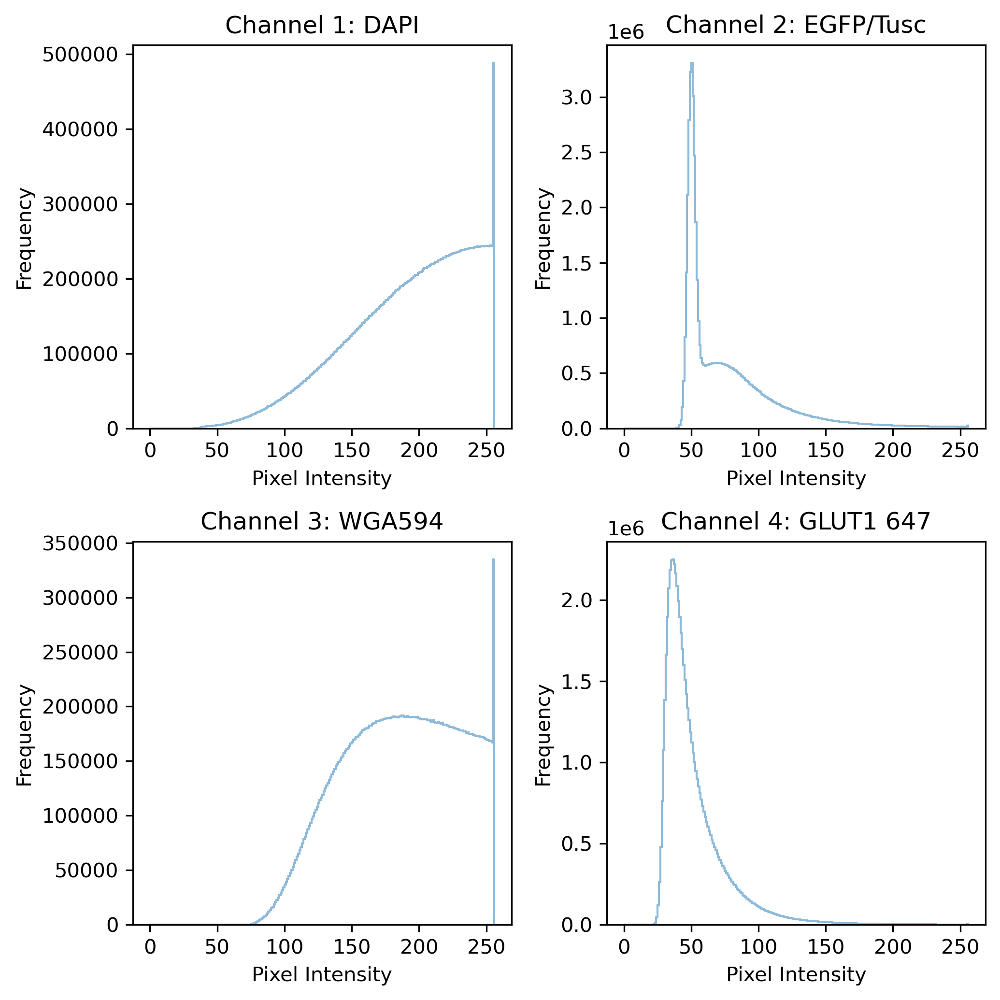

In [204]:
# Replace this with your actual unique stain names from names_excitations['Stain_Name'].unique()
stain_names = names_excitations['Stain_Name'].unique()

# Number of channels in the image stack (assumed to be 4 for the 2x2 plot)
num_channels = image.shape[1]

# Initialize a 2x2 figure for plotting
fig, axes = plt.subplots(2, 2, figsize=(7, 7))

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through each channel and plot the histogram in the corresponding subplot
for ch in range(num_channels):
    # Flatten the (z_slices, x, y) array into 1D
    pixel_values = image[:, ch, :, :].flatten()
    
    # Plot histogram for the current channel
    axes[ch].hist(pixel_values, bins=256, range=(0, 256), alpha=0.5, histtype='step')
    
    # Set the title to the corresponding stain name
    axes[ch].set_title(f'Channel {ch+1}: {stain_names[ch]}')
    axes[ch].set_xlabel('Pixel Intensity')
    axes[ch].set_ylabel('Frequency')

# Adjust layout for better spacing
plt.tight_layout()

# Display the 2x2 histogram grid
plt.show()